In [1]:
import os, random
from glob import glob
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

In [2]:

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ROOT      = '/kaggle/input/fingerprint-dataset-for-fvc2000-db4-b/dataset_FVC2000_DB4_B/dataset'
TRAIN_DIR = os.path.join(ROOT, 'train_data')
REAL_DIR  = os.path.join(ROOT, 'real_data')

# Hyperparameters
BATCH_SIZE = 32
EMB_DIM    = 128
LR         = 1e-4
MARGIN     = 0.6      # increased margin
EPOCHS     = 15
PATIENCE   = 3
K_SHOT     = 5

# Transforms
train_tf = transforms.Compose([
    transforms.Resize((160,160)),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.5],[0.5]),
])
eval_tf = transforms.Compose([
    transforms.Resize((160,160)),
    transforms.ToTensor(),
    transforms.Normalize([0.5],[0.5]),
])

In [3]:
by_label = {}
for path in glob(os.path.join(TRAIN_DIR, '*.bmp')):
    lbl = int(os.path.basename(path).split('_')[0])
    by_label.setdefault(lbl, []).append(path)

train_paths, val_paths, test_paths = {}, {}, {}
for lbl, paths in by_label.items():
    random.shuffle(paths)
    n = len(paths)
    n_test = max(1, int(0.15 * n))
    n_val  = max(1, int(0.15 * n))
    test = paths[:n_test]
    val  = paths[n_test:n_test+n_val]
    train= paths[n_test+n_val:]
    train_paths[lbl] = train
    val_paths[lbl]   = val
    test_paths[lbl]  = test

print("Dataset split:")
print(f"Labels: {len(train_paths)}")
print(f"Example for label 0 => train: {len(train_paths[0])}, val: {len(val_paths[0])}, test: {len(test_paths[0])}")

Dataset split:
Labels: 10
Example for label 0 => train: 56, val: 12, test: 12


In [4]:
class TripletDataset(Dataset):
    def __init__(self, paths_by_label, transform):
        self.by_label = paths_by_label
        self.transform = transform
        self.labels = list(paths_by_label.keys())
        self.samples = [(p,lbl) for lbl, ps in paths_by_label.items() for p in ps]
    def __len__(self):
        return len(self.samples)
    def __getitem__(self, idx):
        path, lbl = self.samples[idx]
        anc = self.transform(Image.open(path).convert('L'))
        pos_path = random.choice([p for p in self.by_label[lbl] if p!=path])
        pos = self.transform(Image.open(pos_path).convert('L'))
        neg_lbl = random.choice([l for l in self.labels if l!=lbl])
        neg_path = random.choice(self.by_label[neg_lbl])
        neg = self.transform(Image.open(neg_path).convert('L'))
        return anc, pos, neg

train_ds = TripletDataset(train_paths, train_tf)
val_ds   = TripletDataset(val_paths,   eval_tf)
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

In [5]:
class ResNet18Embed(nn.Module):
    def __init__(self, emb_dim):
        super().__init__()
        base = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
        base.conv1 = nn.Conv2d(1,64,7,2,3,bias=False)
        self.backbone = nn.Sequential(*list(base.children())[:-1])
        self.fc = nn.Linear(base.fc.in_features, emb_dim)
    def forward(self, x):
        x = self.backbone(x).view(x.size(0), -1)
        z = self.fc(x)
        return z / z.norm(dim=1, keepdim=True)

model = ResNet18Embed(EMB_DIM).to(DEVICE)
criterion = nn.TripletMarginLoss(margin=MARGIN)
optimizer = optim.Adam(model.parameters(), lr=LR)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 183MB/s]


In [6]:
## Cell 5: Training Loop with Early Stopping
best_val_loss = float('inf')
patience_cnt = 0

for ep in range(1, EPOCHS+1):
    # Train
    model.train()
    train_loss = 0.0
    for A,P,N in train_loader:
        A,P,N = A.to(DEVICE), P.to(DEVICE), N.to(DEVICE)
        eA,eP,eN = model(A), model(P), model(N)
        loss = criterion(eA,eP,eN)
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        train_loss += loss.item() * A.size(0)
    train_loss /= len(train_ds)
    # Validate
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for A,P,N in val_loader:
            A,P,N = A.to(DEVICE), P.to(DEVICE), N.to(DEVICE)
            val_loss += criterion(model(A), model(P), model(N)).item() * A.size(0)
    val_loss /= len(val_ds)
    scheduler.step()
    print(f"Epoch {ep:02d} | TrainLoss {train_loss:.4f} | ValLoss {val_loss:.4f}")
    # Early stopping
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_resnet18.pth')
        patience_cnt = 0
    else:
        patience_cnt += 1
        if patience_cnt >= PATIENCE:
            print("Early stopping triggered.")
            break

# Load best model weights
model.load_state_dict(torch.load('best_resnet18.pth'))

Epoch 01 | TrainLoss 0.4859 | ValLoss 0.4231
Epoch 02 | TrainLoss 0.3027 | ValLoss 0.2624
Epoch 03 | TrainLoss 0.1937 | ValLoss 0.2182
Epoch 04 | TrainLoss 0.1855 | ValLoss 0.1592
Epoch 05 | TrainLoss 0.1632 | ValLoss 0.1748
Epoch 06 | TrainLoss 0.1423 | ValLoss 0.1608
Epoch 07 | TrainLoss 0.1271 | ValLoss 0.1480
Epoch 08 | TrainLoss 0.1334 | ValLoss 0.1261
Epoch 09 | TrainLoss 0.0910 | ValLoss 0.1203
Epoch 10 | TrainLoss 0.0995 | ValLoss 0.1062
Epoch 11 | TrainLoss 0.0933 | ValLoss 0.1353
Epoch 12 | TrainLoss 0.0849 | ValLoss 0.1036
Epoch 13 | TrainLoss 0.1201 | ValLoss 0.1024
Epoch 14 | TrainLoss 0.0962 | ValLoss 0.1657
Epoch 15 | TrainLoss 0.0924 | ValLoss 0.1281


/tmp/ipykernel_31/38641868.py:38: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_resnet18.pth'))


<All keys matched successfully>

In [7]:
## Cell 6: Build Prototypes (K_SHOT per user)
prototypes = {}
for lbl, paths in train_paths.items():
    samples_k = random.sample(paths, min(K_SHOT, len(paths)))
    feats = []
    for p in samples_k:
        img = eval_tf(Image.open(p).convert('L')).unsqueeze(0).to(DEVICE)
        feats.append(model(img).squeeze(0))
    proto = torch.stack(feats).mean(0)
    prototypes[lbl] = proto / proto.norm()

In [13]:
## Cell 7: Evaluate on Test Set
correct = total = 0
for lbl, paths in test_paths.items():
    for p in paths:
        img = eval_tf(Image.open(p).convert('L')).unsqueeze(0).to(DEVICE)
        q = model(img).squeeze(0)
        pred = min(prototypes.keys(), key=lambda x: (q-prototypes[x]).norm().item())
        correct += int(pred==lbl)
        total += 1
test_acc = correct/total
print(f"Test Set Accuracy: {correct}/{total} = {test_acc:.3f}")

Test Set Accuracy: 91/120 = 0.758


In [9]:

print("Real-data identification results:")
correct = total = 0
for fn in sorted(os.listdir(REAL_DIR)):
    if not fn.endswith('.bmp'):
        continue
    true_lbl = int(fn.split('.')[0])
    img_path = os.path.join(REAL_DIR, fn)
    img = eval_tf(Image.open(img_path).convert('L')).unsqueeze(0).to(DEVICE)
    q = model(img).squeeze(0)
    pred = min(prototypes.keys(), key=lambda x: (q-prototypes[x]).norm().item())
    sim  = torch.cosine_similarity(q, prototypes[pred], dim=0).item()
    status = "✅" if pred==true_lbl else "❌"
    print(f"{fn}: True={true_lbl}, Pred={pred}, Sim={sim:.2f} {status}")
    correct += int(pred==true_lbl)
    total += 1
real_acc = correct/total
print(f"Real-Data Accuracy: {correct}/{total} = {real_acc:.3f}")

Real-data identification results:
00000.bmp: True=0, Pred=0, Sim=0.97 ✅
00001.bmp: True=1, Pred=1, Sim=0.81 ✅
00002.bmp: True=2, Pred=2, Sim=0.96 ✅
00003.bmp: True=3, Pred=3, Sim=0.96 ✅
00004.bmp: True=4, Pred=4, Sim=0.89 ✅
00005.bmp: True=5, Pred=5, Sim=0.91 ✅
00006.bmp: True=6, Pred=6, Sim=0.96 ✅
00007.bmp: True=7, Pred=5, Sim=0.96 ❌
00008.bmp: True=8, Pred=8, Sim=0.96 ✅
00009.bmp: True=9, Pred=9, Sim=0.97 ✅
Real-Data Accuracy: 9/10 = 0.900


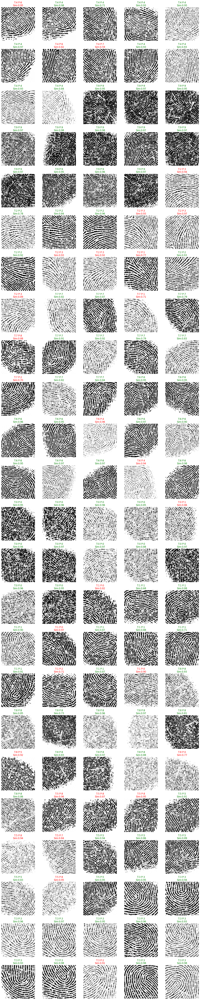


Real-data identification results:
00000.bmp: True=0, Pred=0, Sim=0.97 ✅
00001.bmp: True=1, Pred=1, Sim=0.81 ✅
00002.bmp: True=2, Pred=2, Sim=0.96 ✅
00003.bmp: True=3, Pred=3, Sim=0.96 ✅
00004.bmp: True=4, Pred=4, Sim=0.89 ✅
00005.bmp: True=5, Pred=5, Sim=0.91 ✅
00006.bmp: True=6, Pred=6, Sim=0.96 ✅
00007.bmp: True=7, Pred=5, Sim=0.96 ❌
00008.bmp: True=8, Pred=8, Sim=0.96 ✅
00009.bmp: True=9, Pred=9, Sim=0.97 ✅

Real-Data Accuracy: 9/10 = 0.900


In [10]:
import os
import torch
import matplotlib.pyplot as plt
from PIL import Image

# --- Visualize Test Set ---
test_items = [(lbl, p) for lbl, paths in test_paths.items() for p in paths]
num_items = len(test_items)
cols = 5
rows = (num_items + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
axes = axes.flatten()

for ax, (true_lbl, path) in zip(axes, test_items):
    # Display image
    img = Image.open(path).convert('L')
    ax.imshow(img, cmap='gray')
    ax.axis('off')
    # Predict
    img_t = eval_tf(img).unsqueeze(0).to(DEVICE)
    q = model(img_t).squeeze(0)
    sims = {u: torch.cosine_similarity(q, prototypes[u], dim=0).item() for u in prototypes}
    pred = max(sims, key=sims.get)
    sim_val = sims[pred]
    # Title with color
    color = 'green' if pred == true_lbl else 'red'
    ax.set_title(f"T:{true_lbl} P:{pred}\nSim:{sim_val:.2f}", color=color)

# Hide extra axes
for ax in axes[num_items:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

# --- Real-data Evaluation ---
print("\nReal-data identification results:")
correct = total = 0
for fn in sorted(os.listdir(REAL_DIR)):
    if not fn.endswith('.bmp'):
        continue
    true_lbl = int(fn.split('.')[0])
    img_path = os.path.join(REAL_DIR, fn)
    img = eval_tf(Image.open(img_path).convert('L')).unsqueeze(0).to(DEVICE)
    q = model(img).squeeze(0)
    sims = {u: torch.cosine_similarity(q, prototypes[u], dim=0).item() for u in prototypes}
    pred = max(sims, key=sims.get)
    sim_val = sims[pred]
    status = "✅" if pred == true_lbl else "❌"
    print(f"{fn}: True={true_lbl}, Pred={pred}, Sim={sim_val:.2f} {status}")
    correct += int(pred == true_lbl)
    total += 1

real_acc = correct / total if total > 0 else 0
print(f"\nReal-Data Accuracy: {correct}/{total} = {real_acc:.3f}")